# Running the model locally

Before running the following cells, make sure that you've already downloaded the pretrained models inside ```../pretrained_models/```

In [3]:
%config Completer.use_jedi=False

%load_ext autoreload
%autoreload 2

In [4]:
import sys
sys.path.append("../")
from io import BytesIO

In [5]:
import base64
import requests
import torch
import os
import numpy as np
import argparse
from PIL import Image
import torchvision.transforms as transforms
from torch.autograd import Variable
import torchvision.utils as vutils
from network.Transformer import Transformer

from tqdm import tqdm_notebook
from test_from_code import transform

In [6]:
styles = ["Hosoda", "Hayao", "Shinkai", "Paprika"]

models = {}

for style in tqdm_notebook(styles):
    model = Transformer()
    model.load_state_dict(torch.load(os.path.join("pretrained_models/", style + '_net_G_float.pth')))
    model.eval()
    models[style] = model

<ipython-input-6-670a92f8ba57>:5: TqdmDeprecationWarning: This function will be removed in tqdm==5.0.0
Please use `tqdm.notebook.tqdm` instead of `tqdm.tqdm_notebook`
  for style in tqdm_notebook(styles):


In [7]:
### change this path to test one of the four models locally
path = "../../test-images/paris.jpg"

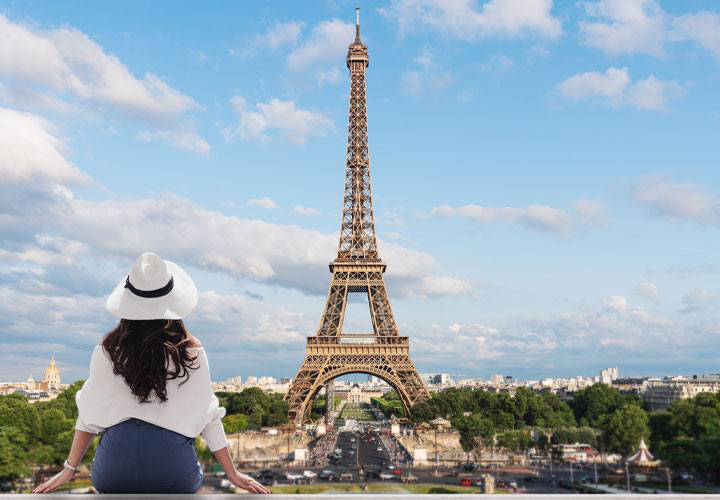

In [8]:
img = Image.open(path)
img

In [17]:
### pick a style in : ["Hosoda", "Hayao", "Shinkai", "Paprika"]
style = "Hosoda"

In [18]:
### choose a load_size, the higher the better are the results, but the longer is the transformation
load_size = 300

In [19]:
%%time
output300 = transform(models, style, path, load_size)

input shape torch.Size([1, 3, 208, 300])
inference time took 3.23052978515625 s
Wall time: 3.26 s


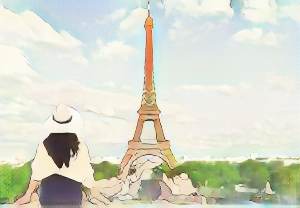

In [21]:
output300

In [22]:
%%time
### load_size to 450
output450 = transform(models, style, path, load_size=450)

input shape torch.Size([1, 3, 312, 450])
inference time took 6.5385212898254395 s
Wall time: 6.58 s


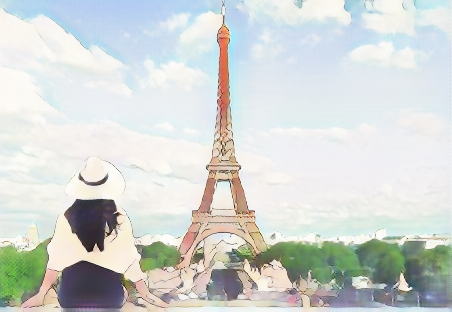

In [23]:
output450

input shape torch.Size([1, 3, 451, 650])
inference time took 13.208370447158813 s
Wall time: 13.3 s


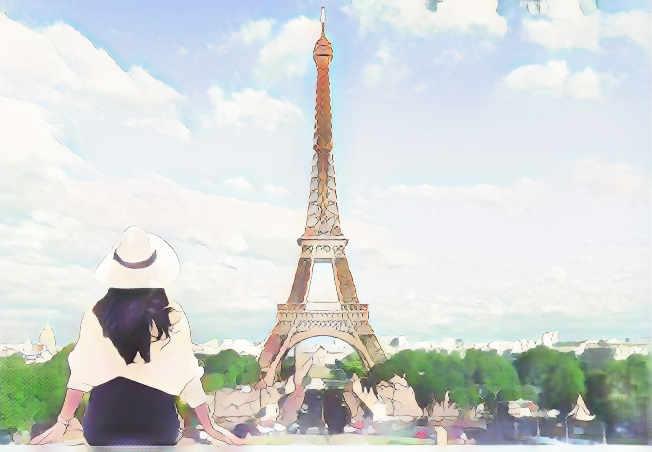

In [25]:
%%time
### load_size to 650
output650 = transform(models, style, path, load_size=650)
output650

input shape torch.Size([1, 3, 451, 650])
inference time took 13.926949501037598 s
Wall time: 14 s


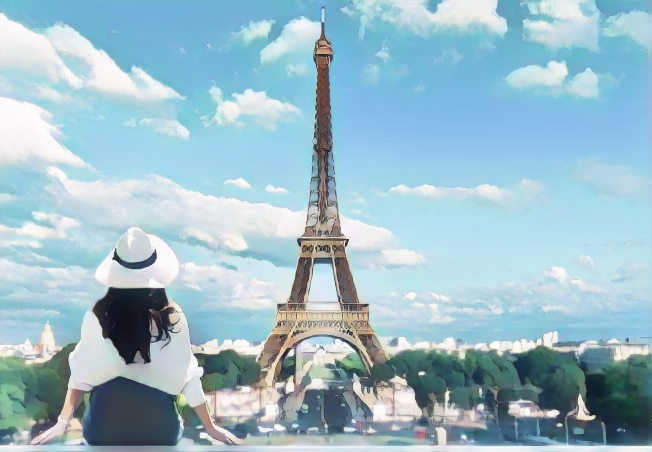

In [26]:
%%time
### load_size to 650
output650 = transform(models, "Shinkai", path, load_size=650)
output650

In [48]:
### change this path to test one of the four models locally
path2 = "../../test-images/sunset.jpg"

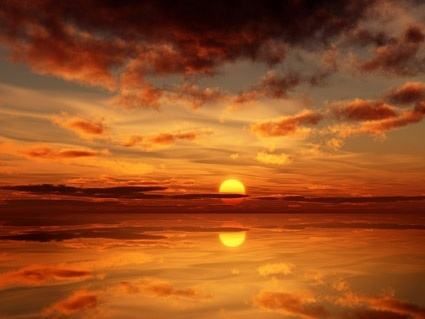

In [49]:
img = Image.open(path2)
img

input shape torch.Size([1, 3, 225, 300])
inference time took 2.435372829437256 s
Wall time: 2.45 s


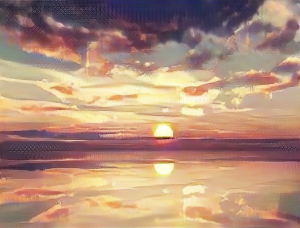

In [50]:
%%time
output300 = transform(models, "Shinkai", path2, load_size= 300)
output300

input shape torch.Size([1, 3, 337, 450])
inference time took 5.494095802307129 s
Wall time: 5.52 s


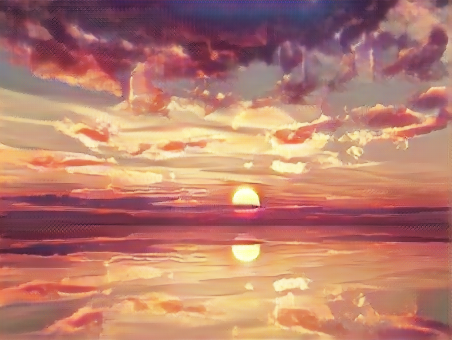

In [51]:
%%time
output450 = transform(models, "Shinkai", path2, load_size= 450)
output450

input shape torch.Size([1, 3, 750, 1000])
inference time took 42.85833287239075 s
Wall time: 43 s


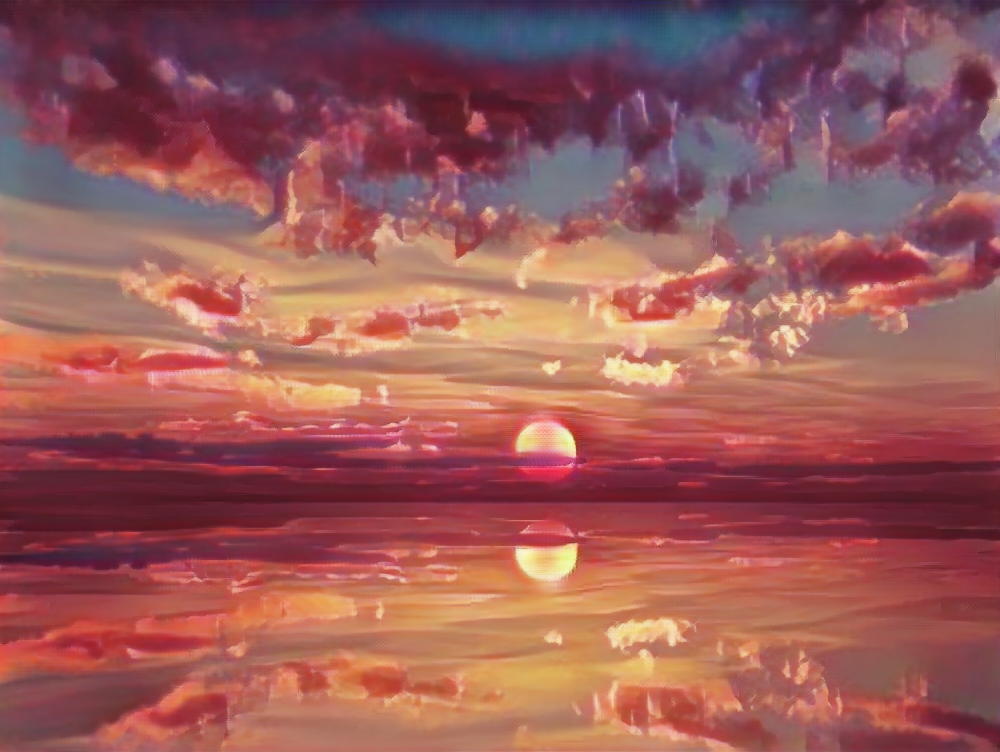

In [33]:
%%time
output1000 = transform(models, "Shinkai", path2, load_size= 1000)
output1000

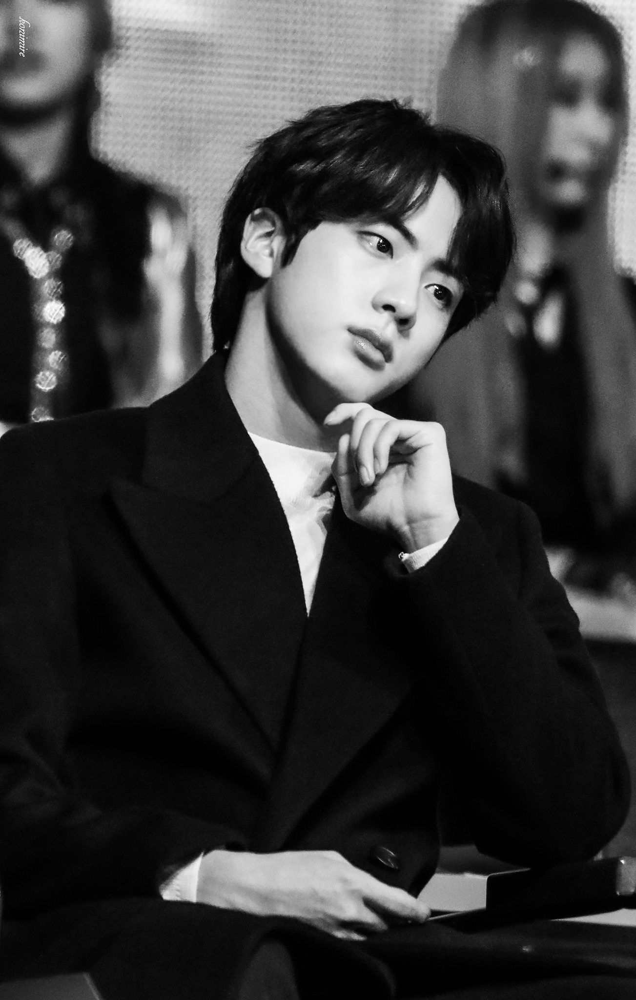

In [34]:
### change this path to test one of the four models locally
path4 = "../../test-images/jiin.jpg"
img = Image.open(path4)
img

input shape torch.Size([1, 3, 650, 413])
inference time took 16.663621187210083 s
Wall time: 17 s


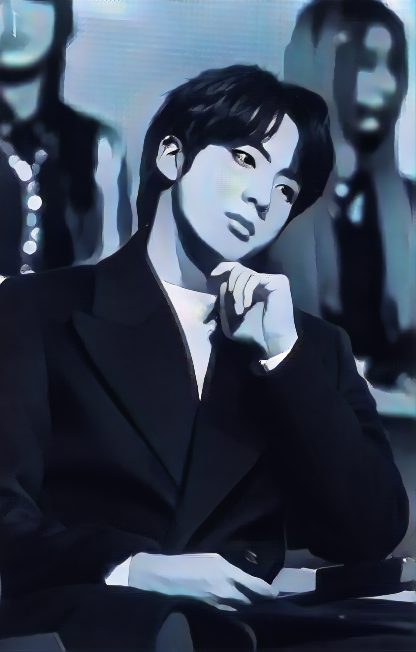

In [36]:
%%time 
output650 = transform(models, "Shinkai", path4, load_size=650)
output650

input shape torch.Size([1, 3, 650, 413])
inference time took 17.29666256904602 s
Wall time: 17.6 s


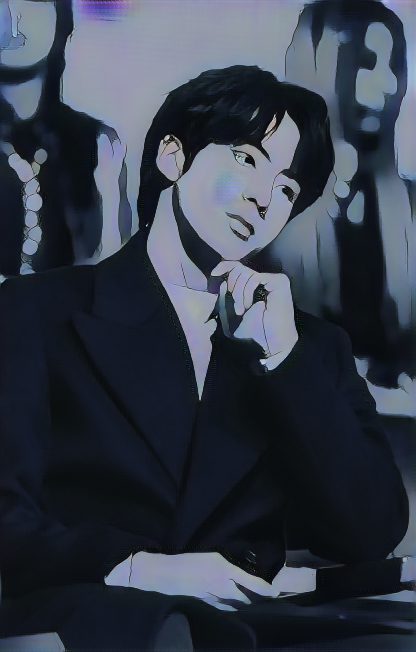

In [37]:
%%time 
output650 = transform(models, "Hosoda", path4, load_size=650)
output650

input shape torch.Size([1, 3, 650, 413])
inference time took 16.75670576095581 s
Wall time: 17.1 s


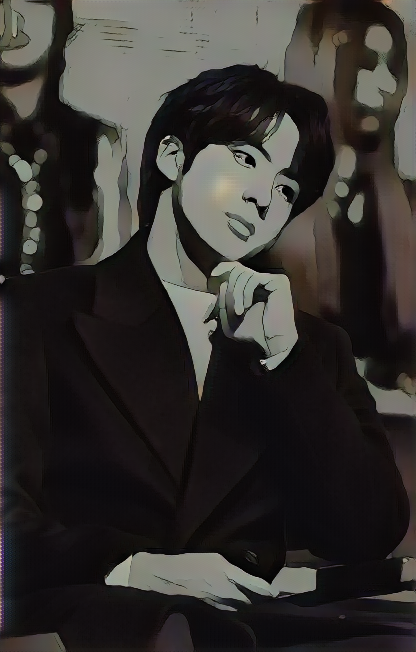

In [38]:
%%time 
output650 = transform(models, "Hayao", path4, load_size=650)
output650

input shape torch.Size([1, 3, 650, 413])
inference time took 16.329281330108643 s
Wall time: 16.7 s


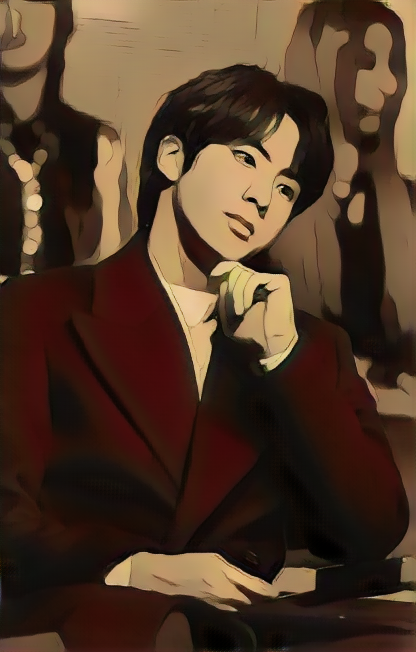

In [39]:
%%time 
output650 = transform(models, "Paprika", path4, load_size=650)
output650

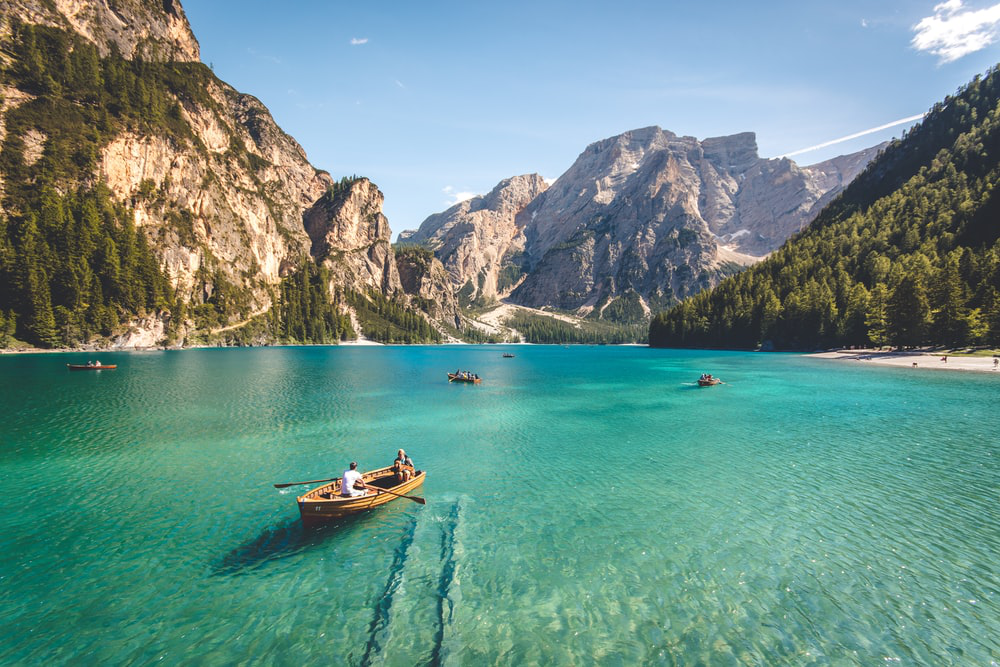

In [10]:
### change this path to test one of the four models locally
path = "../../test-images/boat.jpg"
img = Image.open(path)
img

input shape torch.Size([1, 3, 667, 1000])
inference time took 29.68934154510498 s
Wall time: 29.8 s


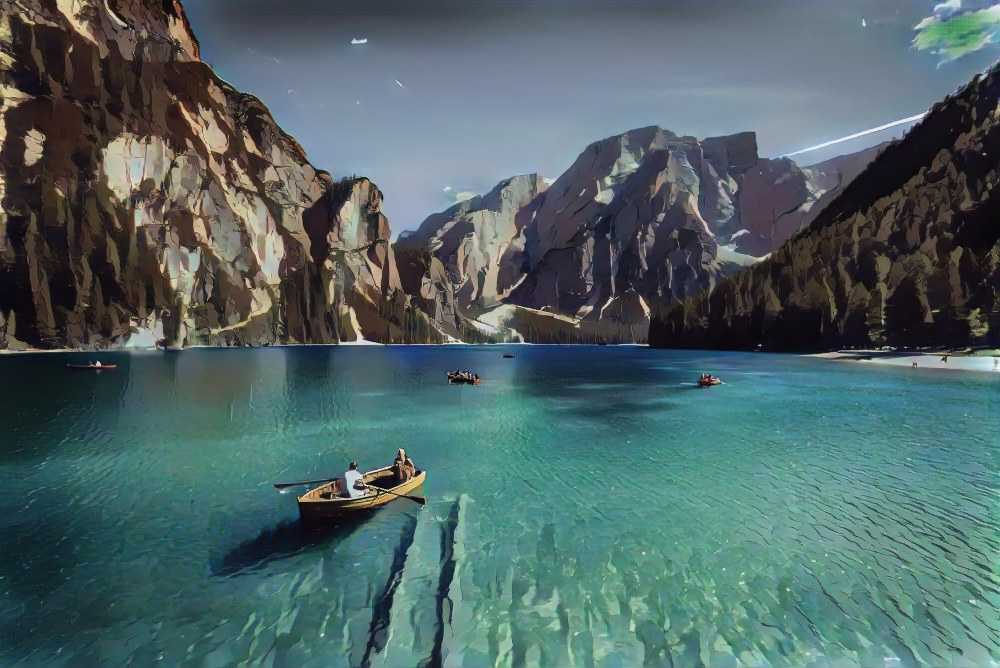

In [14]:
%%time 
output1000 = transform(models, "Shinkai", path, load_size=1000)
output1000

input shape torch.Size([1, 3, 667, 1000])
inference time took 30.56503677368164 s
Wall time: 30.7 s


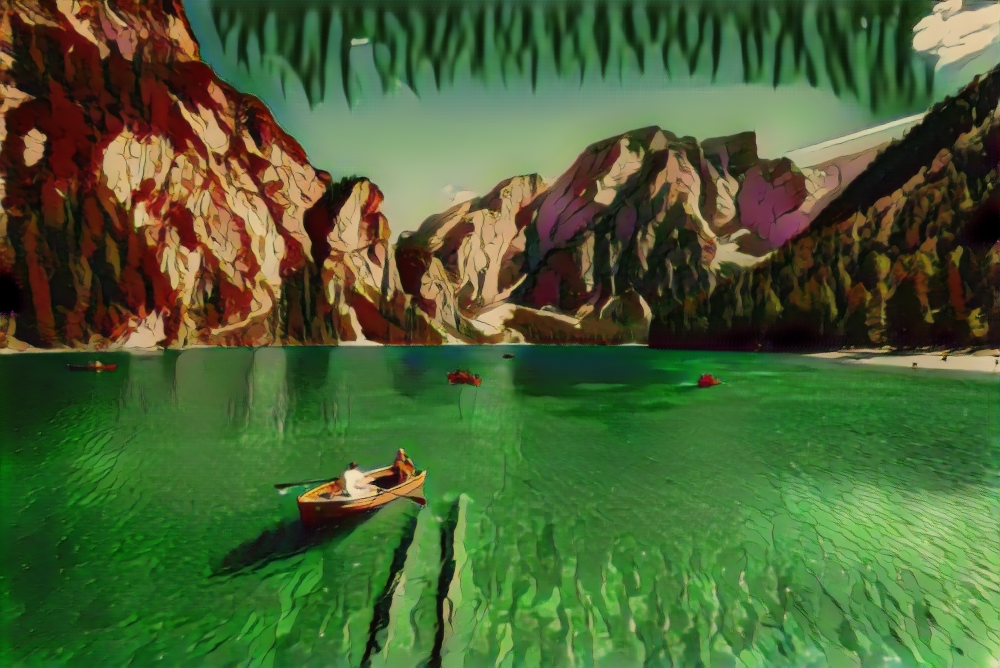

In [11]:
%%time 
output1000 = transform(models, "Paprika", path, load_size=1000)
output1000

input shape torch.Size([1, 3, 667, 1000])
inference time took 31.576573371887207 s
Wall time: 31.7 s


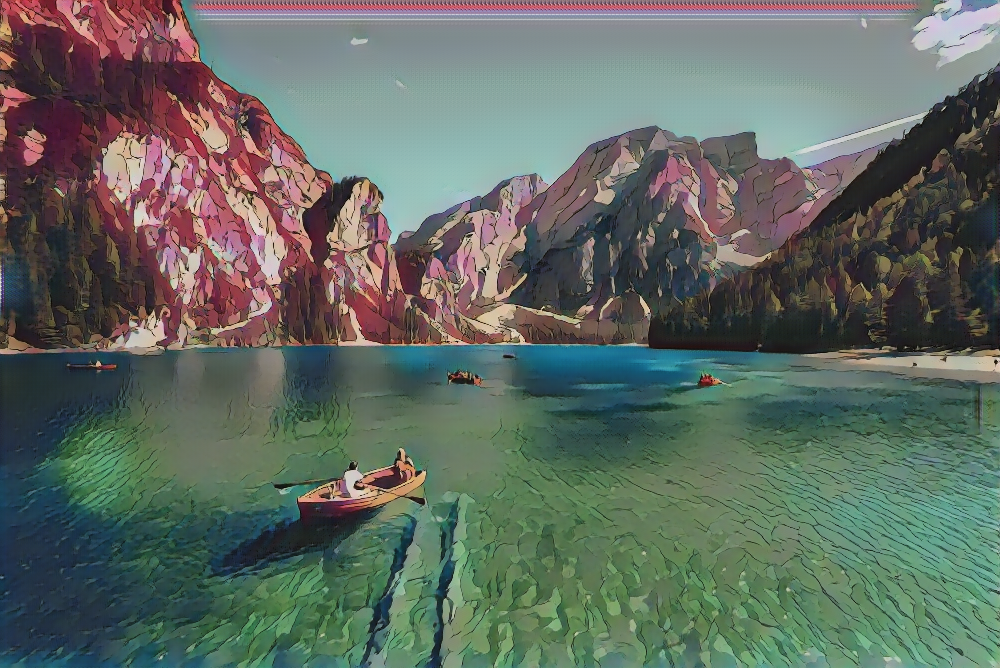

In [13]:
%%time 
output1000 = transform(models, "Hayao", path, load_size=1000)
output1000

input shape torch.Size([1, 3, 667, 1000])
inference time took 31.388554573059082 s
Wall time: 31.5 s


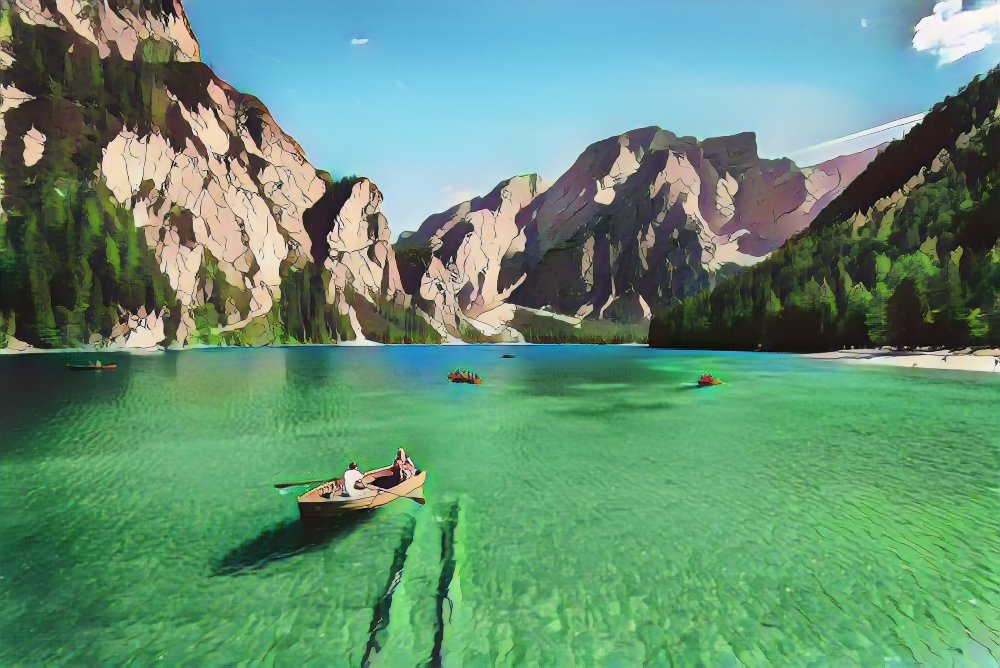

In [12]:
%%time 
output1000 = transform(models, "Hosoda", path, load_size=1000)
output1000

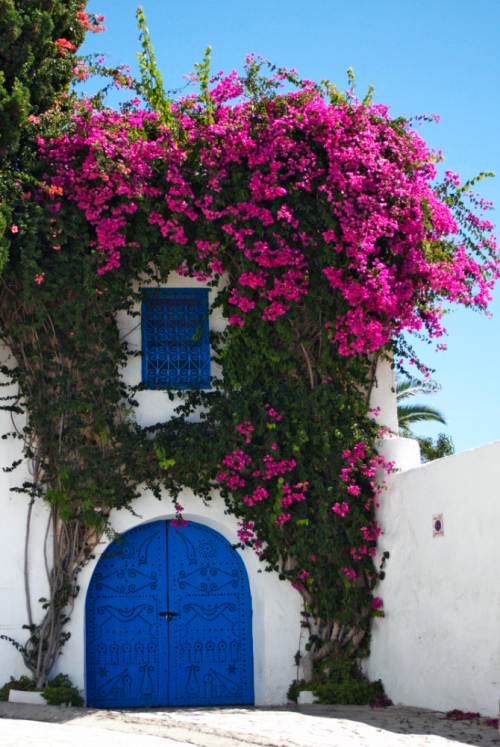

In [34]:
### change this path to test one of the four models locally
path2 = "../../test-images/sidibou.png"
img = Image.open(path2)
img

input shape torch.Size([1, 3, 650, 435])
inference time took 16.770044803619385 s
Wall time: 16.9 s


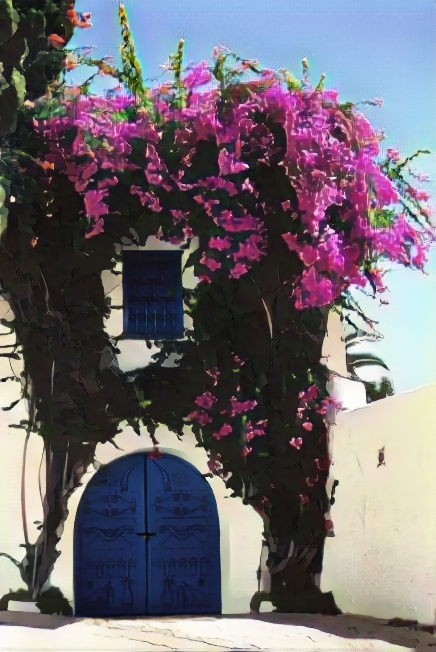

In [35]:
%%time
### load_size to 650
output650 = transform(models, "Shinkai", path2, load_size=650)
output650

input shape torch.Size([1, 3, 650, 435])
inference time took 16.490925788879395 s
Wall time: 16.6 s


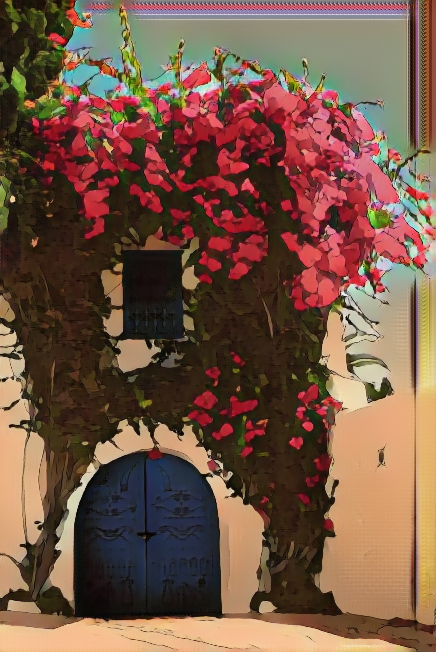

In [36]:
%%time
### load_size to 650
output650 = transform(models, "Hayao", path2, load_size=650)
output650

input shape torch.Size([1, 3, 650, 435])
inference time took 17.42997932434082 s
Wall time: 17.6 s


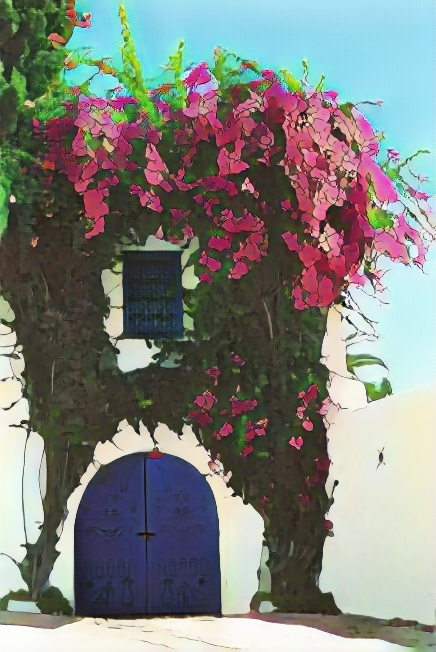

In [37]:
%%time
### load_size to 650
output650 = transform(models, "Hosoda", path2, load_size=650)
output650

input shape torch.Size([1, 3, 650, 435])
inference time took 16.795501947402954 s
Wall time: 16.9 s


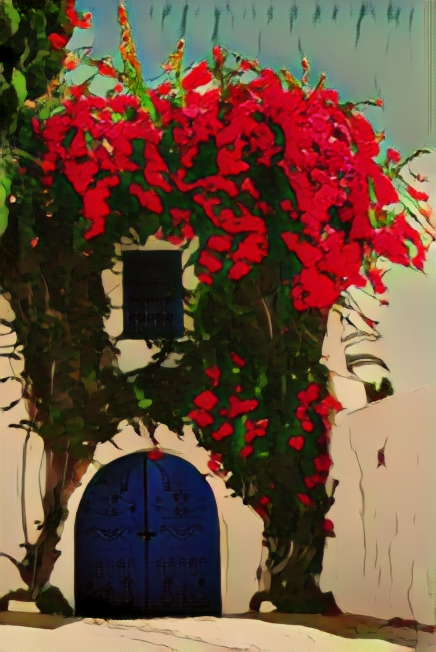

In [38]:
%%time
### load_size to 650
output650 = transform(models, "Paprika", path2, load_size=650)
output650